#**DATA ANALYSIS ON THE REVIEWS OF THE CUSTOMERS**

In [ ]:
from google.colab import drive 
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from wordcloud import WordCloud

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
rdata=pd.read_csv('/content/drive/MyDrive/Reviews_data.csv')
idata=pd.read_csv('/content/drive/MyDrive/Items_data.csv')

In [ ]:
rdata.head() 

,asin,name,rating,date,verified,title,body,helpfulVotes
0,B0000SX2UC,Janet,3,"October 11, 2005",False,"Def not best, but not worst",I had the Samsung A600 for awhile which is abs...,1.0
1,B0000SX2UC,Luke Wyatt,1,"January 7, 2004",False,Text Messaging Doesn't Work,Due to a software issue between Nokia and Spri...,17.0
2,B0000SX2UC,Brooke,5,"December 30, 2003",False,Love This Phone,"This is a great, reliable phone. I also purcha...",5.0
3,B0000SX2UC,amy m. teague,3,"March 18, 2004",False,"Love the Phone, BUT...!","I love the phone and all, because I really did...",1.0
4,B0000SX2UC,tristazbimmer,4,"August 28, 2005",False,"Great phone service and options, lousy case!",The phone has been great for every purpose it ...,1.0


In [ ]:
idata.head()

,asin,brand,title,url,image,rating,reviewUrl,totalReviews,prices
0,B0000SX2UC,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN
1,B0009N5L7K,Motorola,Motorola I265 phone,https://www.amazon.com/Motorola-i265-I265-phon...,https://m.media-amazon.com/images/I/419WBAVDAR...,2.9,https://www.amazon.com/product-reviews/B0009N5L7K,7,$49.95
2,B000SKTZ0S,Motorola,MOTOROLA C168i AT&T CINGULAR PREPAID GOPHONE C...,https://www.amazon.com/MOTOROLA-C168i-CINGULAR...,https://m.media-amazon.com/images/I/71b+q3ydkI...,2.6,https://www.amazon.com/product-reviews/B000SKTZ0S,22,NaN
3,B00198M12M,Nokia,Nokia 6500 Slide Black/silver Unlocked Cell Phone,https://www.amazon.com/Nokia-6500-Slide-silver...,https://m.media-amazon.com/images/I/41ss4HpLkL...,2.4,https://www.amazon.com/product-reviews/B00198M12M,5,NaN
4,B001AO4OUC,Motorola,Motorola i335 Cell Phone Boost Mobile,https://www.amazon.com/Motorola-i335-Phone-Boo...,https://m.media-amazon.com/images/I/710UO8gdT+...,3.3,https://www.amazon.com/product-reviews/B001AO4OUC,21,NaN


In [ ]:
fdata=pd.merge(rdata,idata,on='asin')     #merge datasets

In [ ]:
fdata.head() 

,asin,name,rating_x,date,verified,title_x,body,helpfulVotes,brand,title_y,url,image,rating_y,reviewUrl,totalReviews,prices
0,B0000SX2UC,Janet,3,"October 11, 2005",False,"Def not best, but not worst",I had the Samsung A600 for awhile which is abs...,1.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN
1,B0000SX2UC,Luke Wyatt,1,"January 7, 2004",False,Text Messaging Doesn't Work,Due to a software issue between Nokia and Spri...,17.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN
2,B0000SX2UC,Brooke,5,"December 30, 2003",False,Love This Phone,"This is a great, reliable phone. I also purcha...",5.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN
3,B0000SX2UC,amy m. teague,3,"March 18, 2004",False,"Love the Phone, BUT...!","I love the phone and all, because I really did...",1.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN
4,B0000SX2UC,tristazbimmer,4,"August 28, 2005",False,"Great phone service and options, lousy case!",The phone has been great for every purpose it ...,1.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN


In [ ]:
fdata.dtypes 

asin             object
name             object
rating_x          int64
date             object
verified           bool
title_x          object
body             object
helpfulVotes    float64
brand            object
title_y          object
url              object
image            object
rating_y        float64
reviewUrl        object
totalReviews      int64
prices           object
dtype: object

In [ ]:
fdata.describe()

,rating_x,helpfulVotes,rating_y,totalReviews
count,82815.000000,33134.000000,82815.000000,82815.000000
mean,3.760357,7.204835,3.672872,367.881410
std,1.605644,28.057901,0.418526,264.284909
min,1.000000,1.000000,1.000000,1.000000
25%,2.000000,1.000000,3.400000,141.000000
50%,5.000000,2.000000,3.700000,316.000000
75%,5.000000,4.000000,4.000000,561.000000
max,5.000000,932.000000,5.000000,984.000000


In [ ]:
fdata.shape

(82815, 16)

In [ ]:
fdata.columns

Index(['asin', 'name', 'rating_x', 'date', 'verified', 'title_x', 'body',
       'helpfulVotes', 'brand', 'title_y', 'url', 'image', 'rating_y',
       'reviewUrl', 'totalReviews', 'prices'],
      dtype='object')

In [ ]:
fdata.isnull().sum()

asin                0
name                5
rating_x            0
date                0
verified            0
title_x            10
body               20
helpfulVotes    49681
brand               0
title_y             0
url                 0
image               0
rating_y            0
reviewUrl           0
totalReviews        0
prices          23670
dtype: int64

In [ ]:
fdata['date']=pd.to_datetime(fdata['date']) #CONVERT ARRAY SERIES INTO PANDAS DATETIME 

In [ ]:
fdata['Orderyear']=pd.DatetimeIndex(fdata['date']).year
fdata['Ordermonth']=pd.DatetimeIndex(fdata['date']).month

In [ ]:
fdata.head()

,asin,name,rating_x,date,verified,title_x,body,helpfulVotes,brand,title_y,url,image,rating_y,reviewUrl,totalReviews,prices,Orderyear,Ordermonth
0,B0000SX2UC,Janet,3,2005-10-11,False,"Def not best, but not worst",I had the Samsung A600 for awhile which is abs...,1.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN,2005,10
1,B0000SX2UC,Luke Wyatt,1,2004-01-07,False,Text Messaging Doesn't Work,Due to a software issue between Nokia and Spri...,17.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN,2004,1
2,B0000SX2UC,Brooke,5,2003-12-30,False,Love This Phone,"This is a great, reliable phone. I also purcha...",5.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN,2003,12
3,B0000SX2UC,amy m. teague,3,2004-03-18,False,"Love the Phone, BUT...!","I love the phone and all, because I really did...",1.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN,2004,3
4,B0000SX2UC,tristazbimmer,4,2005-08-28,False,"Great phone service and options, lousy case!",The phone has been great for every purpose it ...,1.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,NaN,2005,8


In [ ]:
fdata.drop('url',axis=1,inplace=True)
fdata.drop('reviewUrl',axis=1,inplace=True)
fdata.drop('rating_y',axis=1,inplace=True)
fdata.drop('image',axis=1,inplace=True)

In [ ]:
#fdata['prices']=str(fdata['prices']) 
fdata['prices'].fillna("0",inplace=True) 

In [ ]:
fdata['prices']=fdata['prices'].replace('$','')

In [ ]:
fdata.head()

,asin,name,rating_x,date,verified,title_x,body,helpfulVotes,brand,title_y,totalReviews,prices,Orderyear,Ordermonth
0,B0000SX2UC,Janet,3,2005-10-11,False,"Def not best, but not worst",I had the Samsung A600 for awhile which is abs...,1.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,14,0,2005,10
1,B0000SX2UC,Luke Wyatt,1,2004-01-07,False,Text Messaging Doesn't Work,Due to a software issue between Nokia and Spri...,17.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,14,0,2004,1
2,B0000SX2UC,Brooke,5,2003-12-30,False,Love This Phone,"This is a great, reliable phone. I also purcha...",5.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,14,0,2003,12
3,B0000SX2UC,amy m. teague,3,2004-03-18,False,"Love the Phone, BUT...!","I love the phone and all, because I really did...",1.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,14,0,2004,3
4,B0000SX2UC,tristazbimmer,4,2005-08-28,False,"Great phone service and options, lousy case!",The phone has been great for every purpose it ...,1.0,Nokia,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,14,0,2005,8


In [ ]:
#RENAMING THE COLUMNS FOR BETTER UNDERSTANDING AND DROPPING THE SPECIFIC COLUMNS 
fdata['phonemodel']=fdata['title_y']
fdata['customername']=fdata['name']
fdata['rating']=fdata['rating_x']
fdata['reviewtitle']=fdata['title_x']
fdata.drop('title_y',axis=1,inplace=True)
fdata.drop('name',axis=1,inplace=True)
fdata.drop('rating_x',axis=1,inplace=True)
fdata.drop('date',axis=1,inplace=True)
fdata.drop('title_x',axis=1,inplace=True)

In [ ]:
fdata.head()

,asin,verified,body,helpfulVotes,brand,totalReviews,prices,Orderyear,Ordermonth,phonemodel,customername,rating,reviewtitle
0,B0000SX2UC,False,I had the Samsung A600 for awhile which is abs...,1.0,Nokia,14,0,2005,10,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Janet,3,"Def not best, but not worst"
1,B0000SX2UC,False,Due to a software issue between Nokia and Spri...,17.0,Nokia,14,0,2004,1,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Luke Wyatt,1,Text Messaging Doesn't Work
2,B0000SX2UC,False,"This is a great, reliable phone. I also purcha...",5.0,Nokia,14,0,2003,12,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Brooke,5,Love This Phone
3,B0000SX2UC,False,"I love the phone and all, because I really did...",1.0,Nokia,14,0,2004,3,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,amy m. teague,3,"Love the Phone, BUT...!"
4,B0000SX2UC,False,The phone has been great for every purpose it ...,1.0,Nokia,14,0,2005,8,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,tristazbimmer,4,"Great phone service and options, lousy case!"


In [ ]:
#sns.distplot(fdata['prices'],color='red')

In [ ]:
# fdata['prices'].dtype 
# #fdata['prices']=str(fdata['prices']).lstrip('$')
# fdata['prices']=fdata['prices'].replace('$','') 
# fdata['prices']

In [ ]:
import re #regular expression
import nltk #natural language tool kit 
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download('stopwords')   #natural language tool kit

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

# **ANALYSIS OF REVIEW TITLE**

In [ ]:
for i in fdata['reviewtitle']: #printing every review seperately
  i=str(i)
  print(i)

Streaming output truncated to the last 5000 lines.
Equipo nuevo, a tiempo pero con cargador europeo.
I was worry, but I'm glad i did it
Samsung Galaxi S10 Plus
Almost the Perfect Phone - Missing the Samsung Radio App
Make sure you specify
🇩🇴🇩🇴🇩🇴
?????? Language barrier
Best Phone I've owned
Great phone.
Display is everything
Excellent service
waste of my $$$$$
It is NOT a fake.
Do NOT purchase if you have VERIZON!
As promised
Expensive
Galaxy S10+
Don't use boost mobile
Great but not what i expected!!!! However it still works!!!
Ad and bugs blocks the normal funcdtion of the phone
un buen telefono pero no el mejor
Excelente producto
Excelente...
Battery life, weight, camera,color presentation...all superior!
Don't Want Bixby!
Comprar directo con el fabricante
I'm happy so far.
Fake phone
Bueno el equipo
Cellphone
Samsung S10 plus
Bad experience. I bought as gift!!!
Samsung Galaxy S10 +
Awesome phone
Internatinal model so you might need to change a couple setting
Good but not perfect
Be

In [ ]:
punc=""            # MERGING ALL THE REVIEWS IN ONE STRING 
for i in fdata['reviewtitle']:
  i=str(i) 
  i.replace("\n","\t") #REPLACING THE NEW LINES WITH TABS
  punc=punc+i
print(punc)

Def not best, but not worstText Messaging Doesn't WorkLove This PhoneLove the Phone, BUT...!Great phone service and options, lousy case!Worked great for meWanna cool Nokia? You have it here!Problem with 3588i universal headsetcool phone!!!!!!!!Pissed off-a little bitworks great, but don't dropt itSlow, annoying, fragile, heavy, and bulky...Worth paying more for something else.Great free phone for Sprint customers.Stupid phoneExellent ServiceI love itPhones lockedExcellent productWARNINGNEXTEL BOOST PHONENice, butIt seems it doesn't work with the existing AT&T SIM card.Five StarsSupply are neededdoes the jobAwesome with a But!!One StarIs cheap but ok qualityThis phone gave me a concussion. and may come with a faulty battery.Three StarsTough phone4-1/2 years!simply great!More than greatmotorola c168iGood little phoneGreat phoneMotorola FanPerfect Bare-Bones and Practically Indestructible Phone!Solid phoneGreat disposible phone?two for one!Second one in 5 yearsthe battery fits but the pla

# **REMOVING PUNCTUATIONS**

In [ ]:
punctuations = '''!()-[]{};:'"\,<>./?@#$%^&*_~''' 
no_punc=""
for i in punc:
     if i not in punctuations:
       no_punc=no_punc+i
print(no_punc)

Def not best but not worstText Messaging Doesnt WorkLove This PhoneLove the Phone BUTGreat phone service and options lousy caseWorked great for meWanna cool Nokia You have it hereProblem with 3588i universal headsetcool phonePissed offa little bitworks great but dont dropt itSlow annoying fragile heavy and bulkyWorth paying more for something elseGreat free phone for Sprint customersStupid phoneExellent ServiceI love itPhones lockedExcellent productWARNINGNEXTEL BOOST PHONENice butIt seems it doesnt work with the existing ATT SIM cardFive StarsSupply are neededdoes the jobAwesome with a ButOne StarIs cheap but ok qualityThis phone gave me a concussion and may come with a faulty batteryThree StarsTough phone412 yearssimply greatMore than greatmotorola c168iGood little phoneGreat phoneMotorola FanPerfect BareBones and Practically Indestructible PhoneSolid phoneGreat disposible phonetwo for oneSecond one in 5 yearsthe battery fits but the plastic guard on the side opposite the contacts is

In [ ]:
no_punc=no_punc.lower()   #CONVERTING TO LOWER CASE
no_punc

'def not best but not worsttext messaging doesnt worklove this phonelove the phone butgreat phone service and options lousy caseworked great for mewanna cool nokia you have it hereproblem with 3588i universal headsetcool phonepissed offa little bitworks great but dont dropt itslow annoying fragile heavy and bulkyworth paying more for something elsegreat free phone for sprint customersstupid phoneexellent servicei love itphones lockedexcellent productwarningnextel boost phonenice butit seems it doesnt work with the existing att sim cardfive starssupply are neededdoes the jobawesome with a butone staris cheap but ok qualitythis phone gave me a concussion and may come with a faulty batterythree starstough phone412 yearssimply greatmore than greatmotorola c168igood little phonegreat phonemotorola fanperfect barebones and practically indestructible phonesolid phonegreat disposible phonetwo for onesecond one in 5 yearsthe battery fits but the plastic guard on the side opposite the contacts i

# **TOKENIZATION**

In [ ]:
tstring=word_tokenize(no_punc)   
print(tstring)

['def', 'not', 'best', 'but', 'not', 'worsttext', 'messaging', 'doesnt', 'worklove', 'this', 'phonelove', 'the', 'phone', 'butgreat', 'phone', 'service', 'and', 'options', 'lousy', 'caseworked', 'great', 'for', 'mewanna', 'cool', 'nokia', 'you', 'have', 'it', 'hereproblem', 'with', '3588i', 'universal', 'headsetcool', 'phonepissed', 'offa', 'little', 'bitworks', 'great', 'but', 'dont', 'dropt', 'itslow', 'annoying', 'fragile', 'heavy', 'and', 'bulkyworth', 'paying', 'more', 'for', 'something', 'elsegreat', 'free', 'phone', 'for', 'sprint', 'customersstupid', 'phoneexellent', 'servicei', 'love', 'itphones', 'lockedexcellent', 'productwarningnextel', 'boost', 'phonenice', 'butit', 'seems', 'it', 'doesnt', 'work', 'with', 'the', 'existing', 'att', 'sim', 'cardfive', 'starssupply', 'are', 'neededdoes', 'the', 'jobawesome', 'with', 'a', 'butone', 'staris', 'cheap', 'but', 'ok', 'qualitythis', 'phone', 'gave', 'me', 'a', 'concussion', 'and', 'may', 'come', 'with', 'a', 'faulty', 'batterythre

# **REMOVING STOPWORDS**

In [ ]:
stop_words = set(stopwords.words('english'))      #LIST OF STOPWORDS
print(stop_words)

{'as', "you'll", 'should', "you'd", 'them', "couldn't", 'themselves', 'same', 'don', 'up', 'himself', 'which', 'own', 'itself', "wasn't", 'shan', 't', 'do', 'just', 'your', 'they', 'whom', 'is', 'did', 'other', "isn't", 'all', 'between', 'during', 'him', 'this', 'hers', 'such', 'above', "won't", 'those', 'until', 'about', 'in', 'over', 'ain', "it's", 'that', 'down', 'yours', 'isn', "mustn't", 'by', 'at', 'am', 'she', 'how', 'yourselves', 'but', "you've", 'where', 'each', 'before', 'ma', 'most', 'so', "hasn't", 'of', 'y', 'who', 'off', 'no', 'couldn', 'when', 'below', 'mightn', 'doing', 'ours', 'can', 'very', 'mustn', 'needn', "you're", "she's", 'was', "that'll", 'than', 'wasn', 'what', 'not', 'won', 'it', 'to', "mightn't", 'll', 'being', 'for', 'herself', 'he', "needn't", 'doesn', 'if', 'its', 'against', 'few', "should've", 'now', 'have', 're', "wouldn't", 'having', 'why', 'o', "didn't", 'hadn', 'hasn', 'we', 'through', 'were', 'their', 'didn', 'some', 'these', 'been', 'm', 'yourself',

In [ ]:
filtered_sentence = [w for w in punc if not w in stop_words]       #REMOVING STOPWORDS
filtered_sentence = []

for w in tstring:                  
    if w not in stop_words: 
        filtered_sentence.append(w)
 
print('Removed Stopwords Tokenized list: ',filtered_sentence)

Removed Stopwords Tokenized list:  ['def', 'best', 'worsttext', 'messaging', 'doesnt', 'worklove', 'phonelove', 'phone', 'butgreat', 'phone', 'service', 'options', 'lousy', 'caseworked', 'great', 'mewanna', 'cool', 'nokia', 'hereproblem', '3588i', 'universal', 'headsetcool', 'phonepissed', 'offa', 'little', 'bitworks', 'great', 'dont', 'dropt', 'itslow', 'annoying', 'fragile', 'heavy', 'bulkyworth', 'paying', 'something', 'elsegreat', 'free', 'phone', 'sprint', 'customersstupid', 'phoneexellent', 'servicei', 'love', 'itphones', 'lockedexcellent', 'productwarningnextel', 'boost', 'phonenice', 'butit', 'seems', 'doesnt', 'work', 'existing', 'att', 'sim', 'cardfive', 'starssupply', 'neededdoes', 'jobawesome', 'butone', 'staris', 'cheap', 'ok', 'qualitythis', 'phone', 'gave', 'concussion', 'may', 'come', 'faulty', 'batterythree', 'starstough', 'phone412', 'yearssimply', 'greatmore', 'greatmotorola', 'c168igood', 'little', 'phonegreat', 'phonemotorola', 'fanperfect', 'barebones', 'practical

In [ ]:
filtered_sentence=str(filtered_sentence)

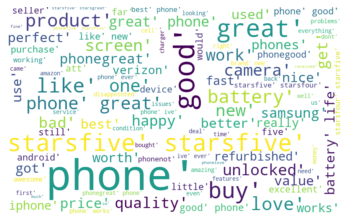

In [ ]:
wordcloud = WordCloud(background_color = 'white',max_font_size = 100,max_words = 100,width = 800,height = 500).generate(filtered_sentence)
plt.imshow(wordcloud,interpolation = 'bilinear')
plt.axis('off')
plt.show()

# **IMPORTING TEXTBLOB FOR POLARITY AND SUBJECTIVITY**

In [ ]:
from textblob import TextBlob  # PROCESSING TEXTUAL DATA

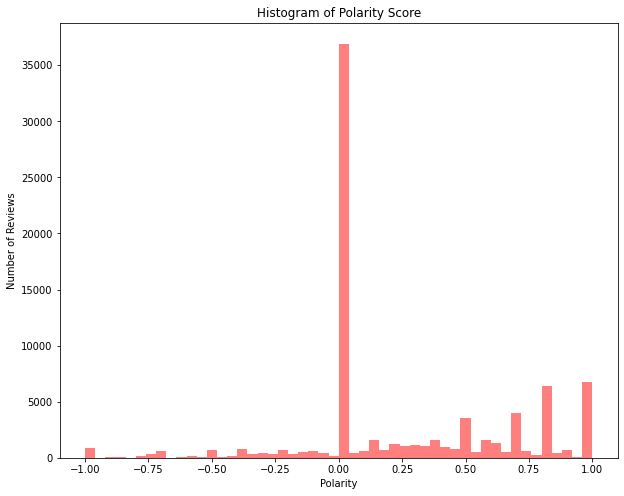

In [ ]:
# quick lambda function to find the polarity of each review 
fdata['reviewtitle']= fdata['reviewtitle'].astype(str)
pol = lambda x: TextBlob(x).sentiment.polarity 
fdata['polarity'] = fdata['reviewtitle'].apply(pol)
num_bins = 50
plt.figure(figsize=(10,8))
n, bins, patches = plt.hist(fdata.polarity, num_bins, facecolor='red', alpha=0.5) 
plt.xlabel('Polarity')
plt.ylabel('Number of Reviews')
plt.title('Histogram of Polarity Score')
plt.show();

In [ ]:
sub = lambda x: TextBlob(x).sentiment.subjectivity         #Subjectivity 
fdata['subjectivity'] = fdata['reviewtitle'].apply(sub) 
fdata.head()

,asin,verified,body,helpfulVotes,brand,totalReviews,prices,Orderyear,Ordermonth,phonemodel,customername,rating,reviewtitle,polarity,subjectivity
0,B0000SX2UC,False,I had the Samsung A600 for awhile which is abs...,1.0,Nokia,14,0,2005,10,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Janet,3,"Def not best, but not worst",0.0000,0.650
1,B0000SX2UC,False,Due to a software issue between Nokia and Spri...,17.0,Nokia,14,0,2004,1,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Luke Wyatt,1,Text Messaging Doesn't Work,0.0000,0.000
2,B0000SX2UC,False,"This is a great, reliable phone. I also purcha...",5.0,Nokia,14,0,2003,12,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Brooke,5,Love This Phone,0.5000,0.600
3,B0000SX2UC,False,"I love the phone and all, because I really did...",1.0,Nokia,14,0,2004,3,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,amy m. teague,3,"Love the Phone, BUT...!",0.6250,0.600
4,B0000SX2UC,False,The phone has been great for every purpose it ...,1.0,Nokia,14,0,2005,8,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,tristazbimmer,4,"Great phone service and options, lousy case!",0.0875,0.625


# **CORRELATION MATRIX**

In [ ]:
fdata.corr()   #corelation table  

,verified,helpfulVotes,totalReviews,Orderyear,Ordermonth,rating,polarity,subjectivity
verified,1.000000,-0.029308,0.020685,0.171287,-0.035074,0.098495,0.034743,-0.019308
helpfulVotes,-0.029308,1.000000,-0.023876,-0.006720,0.020061,-0.039845,-0.010151,-0.008887
totalReviews,0.020685,-0.023876,1.000000,-0.086337,0.003360,-0.015257,-0.018685,-0.014608
Orderyear,0.171287,-0.006720,-0.086337,1.000000,-0.152074,-0.015979,0.040886,0.052338
Ordermonth,-0.035074,0.020061,0.003360,-0.152074,1.000000,-0.014023,-0.004851,0.000646
rating,0.098495,-0.039845,-0.015257,-0.015979,-0.014023,1.000000,0.471078,0.193908
polarity,0.034743,-0.010151,-0.018685,0.040886,-0.004851,0.471078,1.000000,0.533083
subjectivity,-0.019308,-0.008887,-0.014608,0.052338,0.000646,0.193908,0.533083,1.000000


# **SCATTERPLOT FOR POLARITY AND SUBJECTIVITY**

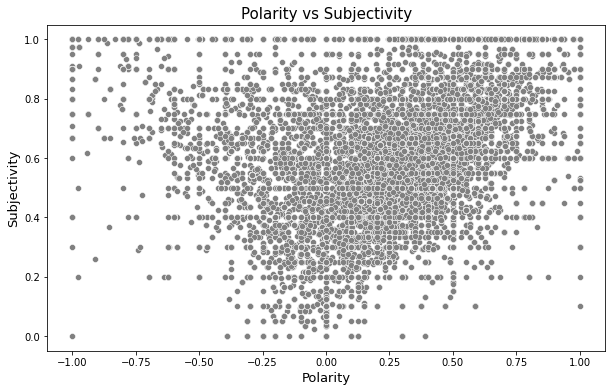

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='polarity', y='subjectivity', data=fdata,palette='Spectral',color="grey")
plt.xlabel('Polarity', fontsize=13)
plt.ylabel('Subjectivity', fontsize=13)
plt.title('Polarity vs Subjectivity', fontsize=15)
plt.show()

# **POSITIVE AND NEGATIVE STATEMENTS**

In [ ]:
fdata.loc[ (fdata.polarity == 1 ) & (fdata.subjectivity == 1), "reviewtitle"].sample(10).tolist()  #LIST OF 10 POSITIVE REVIEWS 

['ABSOLUTELY PERFECT',
 'Perfect for those not looking to break the bank',
 'Excellent',
 'Awesome GSM phone. Get a case!',
 'Excellent graphics',
 'This screen was a perfect size.',
 'Very happy with the Galaxy S8',
 'This phone is awesome.',
 'Excellent',
 'Awesome phone!!!']

In [ ]:
fdata.loc[ (fdata.polarity == -1 ) & (fdata.subjectivity == 1), "reviewtitle"].sample(10).tolist()  #LIST OF 10 NEGATIVE REVIEWS

['Miserable battery life',
 'TERRIBLE PRODUCT INSPECTION',
 'Deceiving and horrible quality.',
 "Worst phone ever. Don't buy from this dealer",
 'HORRIBLE',
 'Worst phone I have ever owned',
 'Horrible battery when I received it',
 'TERRIBLE strups',
 'Ads keep popping up - very annoying',
 'Horrible']

In [ ]:
fdata['polarity']=round(fdata['polarity'],2)
fdata['subjectivity']=round(fdata['subjectivity'],2)

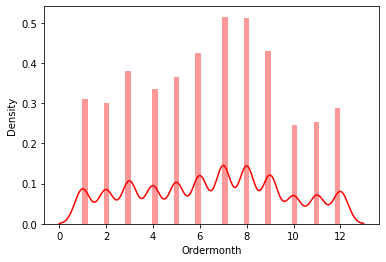

In [ ]:
sns.distplot(fdata['Ordermonth'],color='red') 

## **CONCLUSION -> PEOPLE PREFER MAY-SEP MONTHS MORE FOR SHOPPING MOBILE PHONES,SO THEREFORE MAKING THE MARKETING TEAM ACTIVE DURING THESE MONTHS WILL BE MORE BENEFICIAL FOR THE COMPANY.**

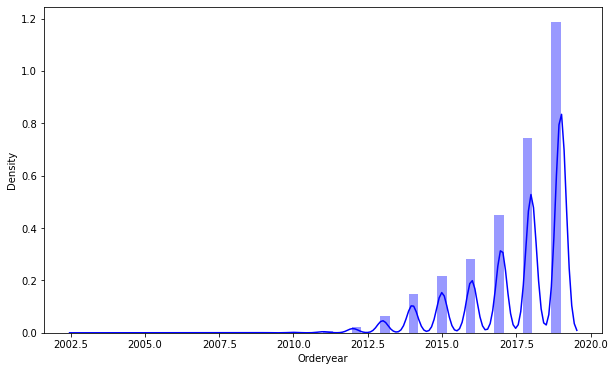

In [ ]:
plt.figure(figsize=(10,6))  
sns.distplot(fdata['Orderyear'],color='blue')

# CONCLUSION -> THERE IS AN UPGRADATION IN THE MOBILE /PHONES INDUSTRY FROM THE LATE 2011th YR. 

# **CONCLUSION-> THERE IS AN UPGRADATION IN THE MOBILE /PHONES INDUSTRY FROM LATE 2011 yr.**

Text(0, 0.5, 'count')

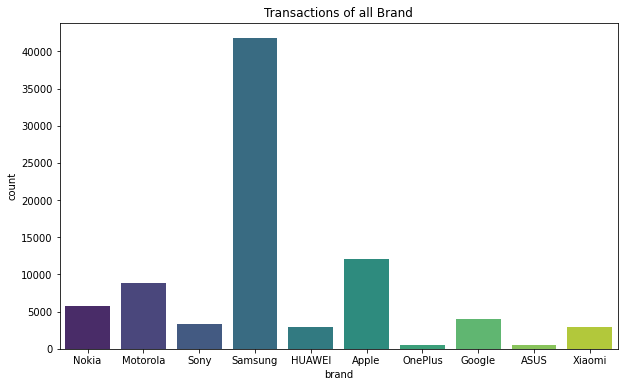

In [ ]:
fig,ax=plt.subplots(figsize=(10,6))
sns.countplot(fdata['brand'],palette='viridis')
plt.title("Transactions of all Brand")
plt.ylabel("count")

#**CONCLUSION -> SAMSUNG IS THE MOST DEMANDING / TRENDING BRAND WITH THE TRANSACTIONS OF ABOVE 40,000 ORDERS.**
#TOP 3 BRANDS -:
#1. SAMSUNG
#2. Apple
#3.MOTOROLA
#BOTTOM 3 BRANDS -:
#1. ONE PLUS
#2. ASUS
#3. XIAOMI 

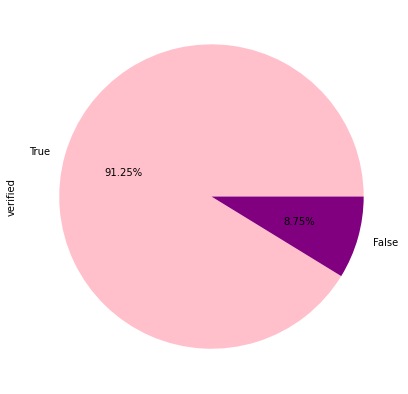

In [ ]:
fig = plt.subplots(figsize=(10,7))
label=['mainstream','budget','Premium']
fbcolor=["pink","purple"]
fdata['verified'].value_counts().plot.pie(autopct='%1.2f%%',colors=fbcolor)

#**DATASET HAS 91.25% VERIFIED PEOPLE AND 8.75% OF UNVERIFIED PEOPLE**

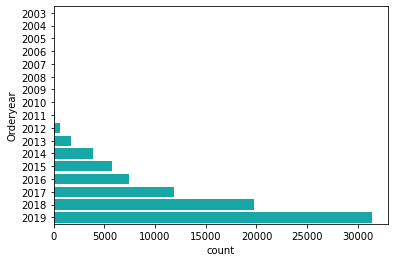

In [ ]:
tips = sns.load_dataset("tips")
sns.countplot(y="Orderyear", data=fdata, color="c") 

#**MAXIMUM SMARTPHONE SALES IS DONE AFTER 2015**

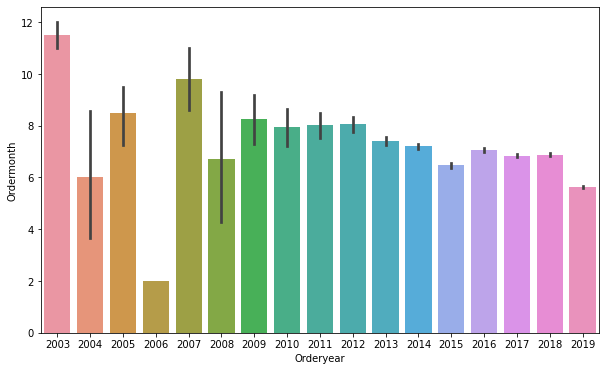

In [ ]:
plt.figure(figsize=(10,6))  #Bar Plot 
ax = sns.barplot(y="Ordermonth", x="Orderyear", data=fdata)

In [ ]:
fdata.head()

,asin,verified,body,helpfulVotes,brand,totalReviews,prices,Orderyear,Ordermonth,phonemodel,customername,rating,reviewtitle,polarity,subjectivity
0,B0000SX2UC,False,I had the Samsung A600 for awhile which is abs...,1.0,Nokia,14,0,2005,10,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Janet,3,"Def not best, but not worst",0.00,0.65
1,B0000SX2UC,False,Due to a software issue between Nokia and Spri...,17.0,Nokia,14,0,2004,1,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Luke Wyatt,1,Text Messaging Doesn't Work,0.00,0.00
2,B0000SX2UC,False,"This is a great, reliable phone. I also purcha...",5.0,Nokia,14,0,2003,12,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Brooke,5,Love This Phone,0.50,0.60
3,B0000SX2UC,False,"I love the phone and all, because I really did...",1.0,Nokia,14,0,2004,3,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,amy m. teague,3,"Love the Phone, BUT...!",0.62,0.60
4,B0000SX2UC,False,The phone has been great for every purpose it ...,1.0,Nokia,14,0,2005,8,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,tristazbimmer,4,"Great phone service and options, lousy case!",0.09,0.62


# **CLASSIFICATION OF CUSTOMERS ON THE BASIS OF THEIR RATINGS**

In [ ]:
def apply_sentiment(r):
    if(r <=1 ):
        return -1
    elif(r>=2 and r<=3):
      return 0
    else:
        return 1 
fdata['Sentiment'] = fdata['rating'].apply(apply_sentiment)
fdata.drop(['rating'],axis = 1, inplace = True) 

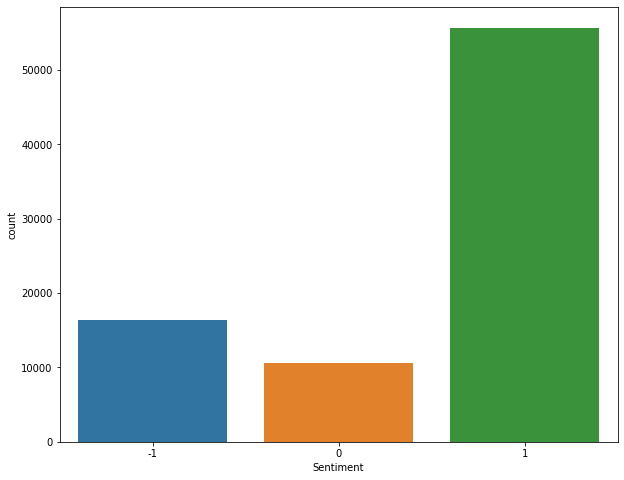

In [ ]:
plt.figure(figsize = (10,8))
sns.countplot(data = fdata, x = 'Sentiment')
plt.show()

# **CUSTOMER ANALYSIS**




**PROMOTORS :    >55,000 PEOPLE**

**NEUTRALS  :    ==10,000 PEOPLE (APPROX)** 

**DETRACTORS:    >=17,000 PEOPLE**

In [ ]:
fdata.head() 

,asin,verified,body,helpfulVotes,brand,totalReviews,prices,Orderyear,Ordermonth,phonemodel,customername,reviewtitle,polarity,subjectivity,Sentiment
0,B0000SX2UC,False,I had the Samsung A600 for awhile which is abs...,1.0,Nokia,14,0,2005,10,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Janet,"Def not best, but not worst",0.00,0.65,0
1,B0000SX2UC,False,Due to a software issue between Nokia and Spri...,17.0,Nokia,14,0,2004,1,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Luke Wyatt,Text Messaging Doesn't Work,0.00,0.00,-1
2,B0000SX2UC,False,"This is a great, reliable phone. I also purcha...",5.0,Nokia,14,0,2003,12,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,Brooke,Love This Phone,0.50,0.60,1
3,B0000SX2UC,False,"I love the phone and all, because I really did...",1.0,Nokia,14,0,2004,3,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,amy m. teague,"Love the Phone, BUT...!",0.62,0.60,0
4,B0000SX2UC,False,The phone has been great for every purpose it ...,1.0,Nokia,14,0,2005,8,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,tristazbimmer,"Great phone service and options, lousy case!",0.09,0.62,1


In [ ]:
fdata.corr()   #CORELATION MATRIX FOR THE DATASET 

,verified,helpfulVotes,totalReviews,Orderyear,Ordermonth,polarity,subjectivity,Sentiment
verified,1.000000,-0.029308,0.020685,0.171287,-0.035074,0.034799,-0.019331,0.090405
helpfulVotes,-0.029308,1.000000,-0.023876,-0.006720,0.020061,-0.010167,-0.008898,-0.043510
totalReviews,0.020685,-0.023876,1.000000,-0.086337,0.003360,-0.018693,-0.014607,-0.016269
Orderyear,0.171287,-0.006720,-0.086337,1.000000,-0.152074,0.040950,0.052313,-0.027622
Ordermonth,-0.035074,0.020061,0.003360,-0.152074,1.000000,-0.004836,0.000613,-0.012474
polarity,0.034799,-0.010167,-0.018693,0.040950,-0.004836,1.000000,0.532954,0.461889
subjectivity,-0.019331,-0.008898,-0.014607,0.052313,0.000613,0.532954,1.000000,0.194516
Sentiment,0.090405,-0.043510,-0.016269,-0.027622,-0.012474,0.461889,0.194516,1.000000


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [ ]:
x=fdata[['polarity','subjectivity','verified']] 
y=fdata['Sentiment']

# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(x, y, train_size=0.7, random_state=42) 
X_train.shape, X_test.shape

((57970, 3), (24845, 3))

In [ ]:
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1, max_depth=5,n_estimators=100, oob_score=True)

In [ ]:
%%time
classifier_rf.fit(X_train, y_train)
print(classifier_rf.oob_score_) #OUT OF BAG SCORE 

0.7154390201828532
CPU times: user 2.76 s, sys: 47.8 ms, total: 2.81 s
Wall time: 1.85 s


In [ ]:
reviewdata=fdata
reviewdata.drop('asin',axis=1,inplace=True)
reviewdata.drop('verified',axis=1,inplace=True)
reviewdata.drop('body',axis=1,inplace=True)
reviewdata.drop('helpfulVotes',axis=1,inplace=True)
reviewdata.drop('brand',axis=1,inplace=True)
reviewdata.drop('totalReviews',axis=1,inplace=True)
reviewdata.drop('prices',axis=1,inplace=True)
reviewdata.drop('Orderyear',axis=1,inplace=True)
reviewdata.drop('Ordermonth',axis=1,inplace=True)
reviewdata.drop('phonemodel',axis=1,inplace=True)
reviewdata.drop('customername',axis=1,inplace=True) 

In [ ]:
reviewdata.head()

,reviewtitle,polarity,subjectivity,Sentiment
0,"Def not best, but not worst",0.00,0.65,0
1,Text Messaging Doesn't Work,0.00,0.00,-1
2,Love This Phone,0.50,0.60,1
3,"Love the Phone, BUT...!",0.62,0.60,0
4,"Great phone service and options, lousy case!",0.09,0.62,1
